imports

In [1]:
import matplotlib.pyplot as plt
import torch
import sys
import os
from sklearn.metrics import f1_score
from tqdm.notebook import tqdm as tqdm
from tqdm.auto import trange
import pandas as pd
import warnings
import seaborn as sns
warnings.filterwarnings("ignore")

from myhelpers import config_plots, TrialStatistics
from HGNN.train import CNN, dataLoader
from HGNN.train.configParser import ConfigParser, getModelName, getDatasetName
config_plots.global_settings()

parameters

In [2]:
experimentsPath="/home/jnl47/Documents/dev/HGNN/experiments/"
dataPath="/home/jnl47/Documents/dev/HGNN/data"
experimentName="allgraded"

cuda=0

Cuda

In [3]:
# set cuda
if torch.cuda.is_available():
    torch.cuda.set_device(cuda)
    print("using cuda", cuda)

using cuda 0


Setup

In [4]:

config_parser = ConfigParser(experimentsPath, dataPath, experimentName)

experimentPathAndName = os.path.join(experimentsPath, experimentName)

# instantiate trial stat object
results_dir = os.path.join(experimentPathAndName, "results")
ts_fine = TrialStatistics.TrialStatistics(results_dir)
ts_coarse = TrialStatistics.TrialStatistics(results_dir, "coarse")

datasetManager = dataLoader.datasetManager(experimentPathAndName)

paramsIterator = config_parser.getExperiments()  
number_of_experiments = sum(1 for e in paramsIterator)


In [5]:
experimentPathAndName

'/home/jnl47/Documents/dev/HGNN/experiments/allgraded'

Show and save trial statistics

In [6]:
def showAndSave():
    with tqdm(total=number_of_experiments, desc="experiment") as bar:
        for experiment_params in config_parser.getExperiments():

            datasetManager.updateParams(config_parser.fixPaths(experiment_params))
            dataset = datasetManager.getDataset()

            # For analyzing experiments, we don't care about augmentation
            dataset.toggle_image_loading(augmentation=False, normalization=dataset.normalization_enabled)

            train_loader, validation_loader, test_loader = datasetManager.getLoaders()
            fineList = dataset.csv_processor.getFineList()
            coarseList = dataset.csv_processor.getCoarseList()
            numberOffine = len(fineList)
            numberOfcoarse = len(coarseList)
            architecture = {
                "fine": numberOffine,
                "coarse" : numberOfcoarse
            }

            # Loop through n trials
            for i in trange(experiment_params["numOfTrials"], desc="trial"):
                modelName = getModelName(experiment_params, i)
                trialName = os.path.join(experimentPathAndName, modelName)

                # Train/Load model
                print(experiment_params)
                model = CNN.create_model(architecture, experiment_params)
                if os.path.exists(CNN.getModelFile(trialName)):
                    df, epochs, time_elapsed = CNN.loadModel(model, trialName)

                    # Update trial outcomes for statistics
                    predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params)
                    ts_fine.addTrialPredictions(experiment_params, predlist, lbllist, numberOffine)
                    micro_f1 = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                    #predlist and lbllist are tensors for predicted and observed of size 88
                    predlist, lbllist = CNN.getLoaderPredictionProbabilities(test_loader, model, experiment_params)
                    topk = CNN.top_k_acc(predlist, lbllist, topk=(3,5))

                    predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params, 'coarse')
                    ts_coarse.addTrialPredictions(experiment_params, predlist, lbllist, numberOfcoarse)
                    micro_f1_coarse = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                    predlist, lbllist = CNN.getLoaderPredictions(validation_loader, model, experiment_params)
                    macro_f1_val = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                    score = {'loss': CNN.getCrossEntropyFromLoader(test_loader, model, experiment_params),
                             'average correct guess prob': CNN.getAvgProbCorrectGuessFromLoader(test_loader, model, experiment_params),
                             'macro f1 test fine': micro_f1,
                             'macro f1 test coarse': micro_f1_coarse,
                             'macro f1 validation fine': macro_f1_val,
                             'time': time_elapsed,
                             'epochs': epochs,
                             'top-3': topk[0].cpu().numpy(),
                             'top-5': topk[1].cpu().numpy(),
                            }

                    ts_fine.addTrial(experiment_params,
                        score, i)
                else:
                    print("Model {0} not found!".format(trialName))

            bar.update()

    # Save experiment results
    ts_fine.saveStatistics()
    ts_fine.saveStatistics(False)
    ts_fine.showStatistics()
    ts_fine.showStatistics(False)
    return ts_fine,ts_coarse,fineList,coarseList

Let's take a look at some of the elements

Show and save confusion matrix

In [7]:
low_ts,low_ts_coarse,low_fineList,low_coarseList = showAndSave()

Creating dataset...


Loading images: 100%|██████████| 1703/1703 [02:23<00:00, 11.89it/s, fileName=INHS_FISH_97787.jpg] 

Creating dataset... Done.
Loading saved indices...
file /home/jnl47/Documents/dev/HGNN/experiments/allgraded/datasplits/b270091ac751885bcba217b9acffac4fdd2fe4f62950f52fd8930511/trainingIndex.csv read
file /home/jnl47/Documents/dev/HGNN/experiments/allgraded/datasplits/b270091ac751885bcba217b9acffac4fdd2fe4f62950f52fd8930511/valIndex.csv read
file /home/jnl47/Documents/dev/HGNN/experiments/allgraded/datasplits/b270091ac751885bcba217b9acffac4fdd2fe4f62950f52fd8930511/testIndex.csv read
Creating loaders...
Creating loaders... Done.


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


Transforming images: 100%|██████████| 1703/1703 [00:21<00:00, 78.23it/s]


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTe

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest'

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
Model /home/jnl47/Documents/dev/HGNN/experiments/allgraded/models/01a954a7e423edd18767d0d3c27560356450eac8dacf64095b44c5e6 not found!
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
Model /home/jnl47/Documents/dev/HGNN/experiments/allgraded/models/6c1a99215e94dc370a578e6219c7e4a60eeccc2647ebce58afce9e7c not found!
{'image_path': 'INHS_segmented_p

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
Model /home/jnl47/Documents/dev/HGNN/experiments/allgraded/models/cbbc6cadb818868492e49ca06d549b674662ed8e759b502f5f65faef not found!
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
Model /home/jnl47/Documents/dev/HGNN/experiments/allgraded/models/2b0df4b1efed86efbd1564a990a38162d27abd95ab18ec948f8c60b0 not found!
{'image_path': 'INHS_segmented_pad

,image_path,suffix,training_count,validation_count,batchSize,n_epochs,learning_rate,numOfTrials,patience,fc_width,fc_layers,modelType,lambda,unsupervisedOnTest,tl_model,augmented,loss,average correct guess prob,macro f1 test fine,macro f1 test coarse,macro f1 validation fine,time,epochs,top-3,top-5,experimentHash,trial,trialHash
0,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.214247,0.701977,0.715948,0.870532,0.746555,5515.627986,772.0,92.082108,95.307915,b6fa90f577bbf358bafbc9be0871fad9ffbc5b5d730248e89ce7f4f2,0,cf5bb78c6fcc769776b2af4bf2d86d7be5835a7f9c4face14827d44f
1,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.218764,0.697479,0.653570,0.949078,0.651347,5267.061427,741.0,90.615829,94.721405,b6fa90f577bbf358bafbc9be0871fad9ffbc5b5d730248e89ce7f4f2,1,da6ca2a1b8ad12991e74803bd87ab970e2ebf23b4d22c56dcfcbb202
2,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.242233,0.672151,0.660383,0.912833,0.694948,4381.806610,616.0,91.788857,95.014656,b6fa90f577bbf358bafbc9be0871fad9ffbc5b5d730248e89ce7f4f2,2,677df81c2eeb53eed6ff314bb021bf9eb4fa0de5005082a48e66968a
3,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.204725,0.712044,0.669052,0.933465,0.737940,5726.488329,804.0,92.082108,96.187683,b6fa90f577bbf358bafbc9be0871fad9ffbc5b5d730248e89ce7f4f2,3,06d0e233eecb44b53f0fa31dd62ff1b940b519cb3c0e26dd3453f5df
4,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.223144,0.692300,0.700732,0.933203,0.707249,4510.861803,634.0,92.082108,96.187683,b6fa90f577bbf358bafbc9be0871fad9ffbc5b5d730248e89ce7f4f2,4,0eaf9f7dc91788f972f0ff055c2d3af7223157b188da3b8c75a503bd
5,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.179518,0.741099,0.678917,0.928331,0.671067,2022.707190,284.0,92.375366,94.428146,6f8a5116b755e5c717fe1aa5ff16a06a2436890ada1c93401c5c9657,0,94af938396ba73d1801356d06229cf1d8c72d99e6206190f211e21a7
6,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.150075,0.771140,0.724258,0.881172,0.703139,2246.948367,316.0,92.375366,95.014656,6f8a5116b755e5c717fe1aa5ff16a06a2436890ada1c93401c5c9657,1,9830b362163494431f52a9c7daac3abfc52e8362dab8bb3a58e08f67
7,INHS_segmented_padded_fish,allgraded,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.159846,0.761681,0.686695,0.926019,0.705230,2497.119349,351.0,90.909088,93.548386,6f8a5116b755e5c717fe1aa5ff16a06a2436890ada1c93401c5c9657,2,eb38f8e93c8a4d4ebd87793eb073059587b8273f51c48c07f1641108


In [8]:
def cm(ts_fine,ts_coarse,fineList,coarseList):
    with tqdm(total=number_of_experiments, desc="experiment") as bar:
        for experiment_params in config_parser.getExperiments():
            print(experiment_params)

            ts_fine.printTrialConfusionMatrix(experiment_params, fineList, printOutput=True)
            ts_coarse.printTrialConfusionMatrix(experiment_params,  coarseList, printOutput=True)

            bar.update()
cm(low_ts,low_ts_coarse,low_fineList,low_coarseList)

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'allgraded', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}



KeyError: '357299248ac34d1b8a5a394a4a299c04bca776a00bbf3eebb17665e4'

In [11]:
experimentName="highqual"
config_parser = ConfigParser(experimentsPath, dataPath, experimentName)

experimentPathAndName = os.path.join(experimentsPath, experimentName)

# instantiate trial stat object
results_dir = os.path.join(experimentPathAndName, "results")
ts = TrialStatistics.TrialStatistics(results_dir)
ts_coarse = TrialStatistics.TrialStatistics(results_dir, "coarse")

datasetManager = dataLoader.datasetManager(experimentPathAndName)

paramsIterator = config_parser.getExperiments()  
number_of_experiments = sum(1 for e in paramsIterator)


In [12]:
high_ts,high_ts_coarse,high_fineList,high_coarseList = showAndSave()

Loading images:   2%|▏         | 2/114 [00:00<00:06, 17.03it/s, fileName=INHS_FISH_99243.jpg]

Creating dataset...


Loading images: 100%|██████████| 114/114 [00:09<00:00, 12.64it/s, fileName=INHS_FISH_97610.jpg]

Creating dataset... Done.
Loading saved indices...
file /home/jnl47/Documents/dev/HGNN/experiments/highqual/datasplits/d2b434b87bd989313488f8f79f8ea701128421aa2d6d7bdff5a352ef/trainingIndex.csv read
file /home/jnl47/Documents/dev/HGNN/experiments/highqual/datasplits/d2b434b87bd989313488f8f79f8ea701128421aa2d6d7bdff5a352ef/valIndex.csv read
file /home/jnl47/Documents/dev/HGNN/experiments/highqual/datasplits/d2b434b87bd989313488f8f79f8ea701128421aa2d6d7bdff5a352ef/testIndex.csv read
Creating loaders...
Creating loaders... Done.


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


Transforming images: 100%|██████████| 114/114 [00:01<00:00, 81.98it/s]


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest'

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': F

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': Fals

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 

,image_path,suffix,training_count,validation_count,batchSize,n_epochs,learning_rate,numOfTrials,patience,fc_width,fc_layers,modelType,lambda,unsupervisedOnTest,tl_model,augmented,loss,average correct guess prob,macro f1 test fine,macro f1 test coarse,macro f1 validation fine,time,epochs,top-3,top-5,experimentHash,trial,trialHash
0,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.675501,0.160983,0.279365,0.591101,0.538889,82.854388,193.0,69.565216,82.608696,9c495b6631fbf8a581bf264c543ae682faca48be5a9d24d9ce08f346,0,35989633951cd22aa34f680a041fa2a6874ff0754edd73690f88d1db
1,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.680592,0.156325,0.224444,0.502694,0.453846,65.359516,151.0,65.217392,78.260864,9c495b6631fbf8a581bf264c543ae682faca48be5a9d24d9ce08f346,1,9848c1854becfd09e838bf8730ae70ab2816691dfc4586793ed2cf15
2,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.639054,0.197839,0.471429,0.568879,0.416667,177.947816,406.0,78.260864,82.608696,9c495b6631fbf8a581bf264c543ae682faca48be5a9d24d9ce08f346,2,8cedc75d0037bcab9ef16307df0ddfb5b84511ddb1ea4c2f088de6aa
3,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.634685,0.203239,0.324444,0.746439,0.736111,58.843625,133.0,65.217392,78.260864,9c495b6631fbf8a581bf264c543ae682faca48be5a9d24d9ce08f346,3,9e396442ebff182b3f81dea686df7549170f8351f7f26c24d3a7eb4c
4,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0001,5,50,200,1,BB,0.6,False,ResNet18,False,2.653321,0.183573,0.393651,0.679640,0.275556,101.057643,228.0,69.565216,73.913040,9c495b6631fbf8a581bf264c543ae682faca48be5a9d24d9ce08f346,4,f0fc0b2192820e81b6b2387fecd5dfb35871a63da5f38f0e56c0be16
5,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.568184,0.270327,0.511905,0.762626,0.711111,93.500804,211.0,95.652176,95.652176,94581e55ce4681a16905236cdd2710a1ce514454fd71b8c546e41858,0,9b306f3437681dd4e672e488d1fd4184c60d0b42730df66870abc345
6,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.596785,0.241509,0.478571,0.652259,0.612821,86.952294,196.0,73.913040,91.304344,94581e55ce4681a16905236cdd2710a1ce514454fd71b8c546e41858,1,0ae2926c03897aeed02a961258d2d47982d491878d9fe96f556efbde
7,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.534430,0.306720,0.383333,0.694250,0.641667,177.378240,400.0,78.260864,82.608696,94581e55ce4681a16905236cdd2710a1ce514454fd71b8c546e41858,2,8d1eda409ffd766f97b132389230c3cb5655dd10e31530479e040167
8,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.547258,0.292530,0.497959,0.720635,0.761111,127.349840,287.0,82.608696,82.608696,94581e55ce4681a16905236cdd2710a1ce514454fd71b8c546e41858,3,cf66f74a699b8ce79052a89e2439aeab6b5be30fe128c2d8d5ae1249
9,INHS_segmented_padded_fish,highqual,0.64,0.16,32,5000,0.0010,5,50,200,1,BB,0.6,False,ResNet18,False,2.537760,0.302446,0.523810,0.714286,0.738889,166.073744,374.0,82.608696,91.304344,94581e55ce4681a16905236cdd2710a1ce514454fd71b8c546e41858,4,042b62c7a886d4fb21e8c49e19deff70ca59f4e3e71da143f7ae9ff3


In [13]:
cm(high_ts,high_ts_coarse,high_fineList,high_coarseList)

{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_segmented_padded_fish', 'suffix': 'highqual', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 5, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


In [16]:
ts_fine.showStatistics()

In [21]:
high_coarseList

['Lepomis', 'Notropis', 'Esox', 'Gambusia', 'Noturus', 'Phenacobius']

In [20]:
low_coarseList

['Phenacobius', 'Esox', 'Lepomis', 'Notropis', 'Gambusia', 'Noturus']

In [28]:
high_ts.agg_df['macro f1 test fine']

,mean,std
0,0.339,0.097
1,0.479,0.056
2,0.453,0.081
3,0.367,0.035


In [29]:
low_ts.agg_df['macro f1 test fine']

,mean,std
0,0.278,0.064
1,0.432,0.059
2,0.380,0.059
3,0.306,0.041


In [31]:
high_ts.df['macro f1 test fine']

0     0.279365
1     0.224444
2     0.471429
3     0.324444
4     0.393651
5     0.511905
6     0.478571
7     0.383333
8     0.497959
9     0.523810
10    0.453571
11    0.430272
12    0.459864
13    0.347619
14    0.573129
15    0.354082
16    0.368367
17    0.402721
18    0.313605
19    0.394048
Name: macro f1 test fine, dtype: float64

In [32]:
low_ts.df['macro f1 test fine']

0     0.177778
1     0.257778
2     0.344444
3     0.315556
4     0.293333
5     0.427407
6     0.484444
7     0.350159
8     0.492381
9     0.407778
10    0.373333
11    0.330909
12    0.369206
13    0.481270
14    0.346984
15    0.332169
16    0.275556
17    0.338095
18    0.248889
19    0.336825
Name: macro f1 test fine, dtype: float64

In [50]:
f1_fine_compar_melted

,image quality,f1 score
0,low,0.177778
1,low,0.257778
2,low,0.344444
3,low,0.315556
4,low,0.293333
5,low,0.427407
6,low,0.484444
7,low,0.350159
8,low,0.492381
9,low,0.407778


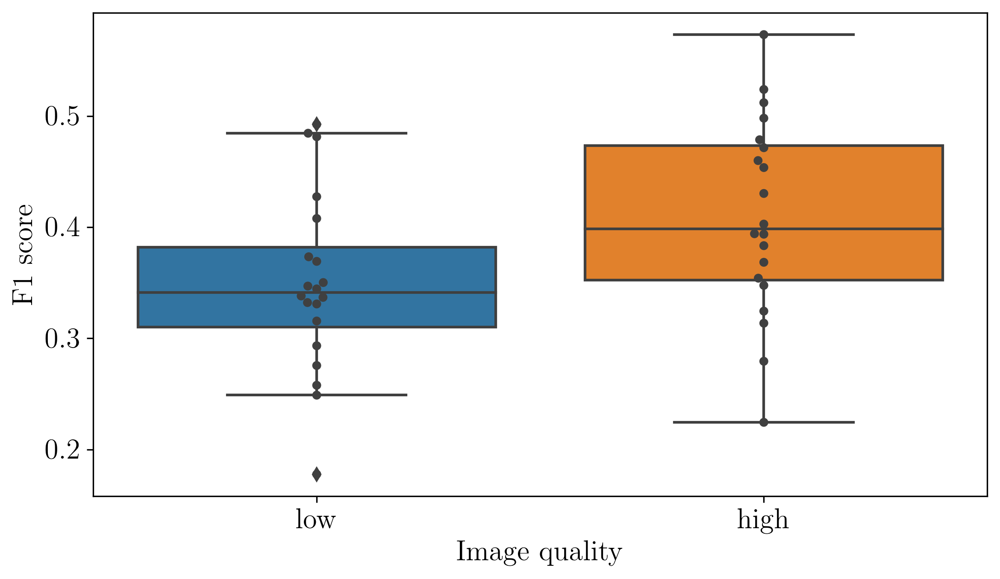

In [80]:
f1_fine_compar = pd.concat([low_ts.df['macro f1 test fine'], high_ts.df['macro f1 test fine']], axis=1)
f1_fine_compar.columns = ['low','high']
f1_fine_compar_melted=f1_fine_compar.melt()
f1_fine_compar_melted.columns = ['Image quality','F1 score']
ax = sns.boxplot(x="Image quality", y="F1 score", data=f1_fine_compar_melted)
ax = sns.swarmplot(x="Image quality", y="F1 score", data=f1_fine_compar_melted, color=".25")


In [90]:
import scipy
f1_fine_compar.mean(axis=0)

low     0.349215
high    0.409310
dtype: float64

In [91]:
scipy.stats.ttest_ind(f1_fine_compar['low'], f1_fine_compar['high'], equal_var=False)


Ttest_indResult(statistic=-2.2368661117899826, pvalue=0.03128713443964204)

In [75]:
experimentName="lowqual"
expiter=config_parser.getExperiments()
experiment_params=next(expiter)
datasetManager.updateParams(config_parser.fixPaths(experiment_params))
high_dataset = datasetManager.getDataset()
dataset.toggle_image_loading(augmentation=False, normalization=dataset.normalization_enabled)
train_loader, validation_loader, test_loader = datasetManager.getLoaders()
fineList = dataset.csv_processor.getFineList()
coarseList = dataset.csv_processor.getCoarseList()
numberOffine = len(fineList)
numberOfcoarse = len(coarseList)
architecture = {
    "fine": numberOffine,
    "coarse" : numberOfcoarse
}
modelName = getModelName(experiment_params, 1)
modelName
trialName = os.path.join(experimentPathAndName, modelName)
model = CNN.create_model(architecture, experiment_params)
df, epochs, time_elapsed = CNN.loadModel(model, trialName)
predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params)
uber_ts = TrialStatistics.TrialStatistics(results_dir, "coarse")
uber_ts.addTrialPredictions(experiment_params, predlist, lbllist, numberOffine)
micro_f1 = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')
predlist, lbllist = CNN.getLoaderPredictionProbabilities(test_loader, model, experiment_params)
topk = CNN.top_k_acc(predlist, lbllist, topk=(3,5))

predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params, 'coarse')
ts_coarse.addTrialPredictions(experiment_params, predlist, lbllist, numberOfcoarse)
micro_f1_coarse = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

predlist, lbllist = CNN.getLoaderPredictions(validation_loader, model, experiment_params)
macro_f1_val = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')


Creating loaders...
Creating loaders... Done.


In [78]:
lbllist

tensor([ 0,  3,  0,  6,  5, 11,  2, 12, 12, 13,  3,  0,  8,  1,  7,  6,  4,  7,
         8])

In [ ]:

        for experiment_params in config_parser.getExperiments():

            datasetManager.updateParams(config_parser.fixPaths(experiment_params))
            dataset = datasetManager.getDataset()

            # For analyzing experiments, we don't care about augmentation
            dataset.toggle_image_loading(augmentation=False, normalization=dataset.normalization_enabled)

            train_loader, validation_loader, test_loader = datasetManager.getLoaders()
            fineList = dataset.csv_processor.getFineList()
            coarseList = dataset.csv_processor.getCoarseList()
            numberOffine = len(fineList)
            numberOfcoarse = len(coarseList)
            architecture = {
                "fine": numberOffine,
                "coarse" : numberOfcoarse
            }

            # Loop through n trials
            for i in trange(experiment_params["numOfTrials"], desc="trial"):
                modelName = getModelName(experiment_params, i)
                trialName = os.path.join(experimentPathAndName, modelName)

                # Train/Load model
                print(experiment_params)
                model = CNN.create_model(architecture, experiment_params)
                if os.path.exists(CNN.getModelFile(trialName)):
                    df, epochs, time_elapsed = CNN.loadModel(model, trialName)

                    # Update trial outcomes for statistics
                    predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params)
                    ts.addTrialPredictions(experiment_params, predlist, lbllist, numberOffine)
                    micro_f1 = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                    #predlist and lbllist are tensors for predicted and observed of size 88
                    predlist, lbllist = CNN.getLoaderPredictionProbabilities(test_loader, model, experiment_params)
                    topk = CNN.top_k_acc(predlist, lbllist, topk=(3,5))

                    predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params, 'coarse')
                    ts_coarse.addTrialPredictions(experiment_params, predlist, lbllist, numberOfcoarse)
                    micro_f1_coarse = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                    predlist, lbllist = CNN.getLoaderPredictions(validation_loader, model, experiment_params)
                    macro_f1_val = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                    score = {'loss': CNN.getCrossEntropyFromLoader(test_loader, model, experiment_params),
                             'average correct guess prob': CNN.getAvgProbCorrectGuessFromLoader(test_loader, model, experiment_params),
                             'macro f1 test fine': micro_f1,
                             'macro f1 test coarse': micro_f1_coarse,
                             'macro f1 validation fine': macro_f1_val,
                             'time': time_elapsed,
                             'epochs': epochs,
                             'top-3': topk[0].cpu().numpy(),
                             'top-5': topk[1].cpu().numpy(),
                            }

                    ts.addTrial(experiment_params,
                        score, i)
                else:
                    print("Model {0} not found!".format(trialName))

            bar.update()

    # Save experiment results
    ts.saveStatistics()
    ts.saveStatistics(False)
    ts.showStatistics()
    ts.showStatistics(False)
    return ts,ts_coarse,fineList,coarseList